# **Atividade Computacional 01 - TEEC III**
## Aluno: André Paiva Conrado Rodrigues

### Importando bibliotecas e arquivo `.wav`

Nesta seção do código, são importadas bibliotecas de manipulação de dados importantes para a obtenção das amostras do arquivo `.wav`, bem como para a manipulação das mesmas.

Após importar o arquivo `.wav`, são exibidos os seguintes dados:


*   Número de amostras do arquivo `.wav`;
*   Taxa de amostragem do arquivo `.wav`;
*   Profundidade de bits das amostras.

Além disso, é disponibilizado um reprodutor do arquivo `.wav` importado.


In [136]:
import numpy as np
import math
from scipy import signal, misc
from scipy.io import wavfile
from IPython.display import Audio
import matplotlib.pyplot as plt
import warnings

warnings.filterwarnings('ignore')

samplerate, data = wavfile.read('guitar.wav')
qtdSamples = data.shape[0]
print(f"Número de amostras = {qtdSamples}")
print(f"Taxa de amostragem = {samplerate} Hz")
print(f"Profundidade de bit = {data.dtype}\n")
Audio('guitar.wav',rate=samplerate)

Número de amostras = 411136
Taxa de amostragem = 44100 Hz
Profundidade de bit = int16



### Definindo funções para plotagem de gráficos

Nesta seção de código estou definindo a função `plotar` para plotar os gráficos com a biblioteca `matplotlib`, e nela passo dois parâmetros:


*   *fx*, que é o numpy array que contém as amostras do áudio após aplicação do efeito;
*   *title*, que é o título do gráfico da forma de onda do áudio após aplicação do efeito.

Além disso, também é definida a função `plotarH` para plotagem de resposta em frequência, para a qual passo três parâmetros:


*   *numerador*, que é o numpy array com os coeficientes do numerador da resposta em frequência;
*   *denominador*, que é o numpy array com os coeficientes do denominador da resposta em frequência;
*   *system*, que é o nome do sistema cuja resposta em frequência é plotada (tal informação é usada no título do gráfico).


In [137]:
def plotar(fx, title):
    fig, (origplot, fxplot) = plt.subplots(2, 1, sharex=True, figsize=(30,10))
    origplot.plot(data)
    origplot.set_title('Áudio original')
    origplot.margins(0, 0.1)
    fxplot.plot(fx)
    fxplot.set_title(title)
    fxplot.margins(0, 0.1)
    fig.tight_layout()
    fig.show()

def plotarH(numerador, denominador, system):
    w, h = signal.freqz(numerador, denominador)
    fig, ax1 = plt.subplots(figsize=(25,6))
    title = "Resposta em frequência do sistema " + system
    ax1.set_title(title)
    ax1.plot(w, 20 * np.log10(abs(h)), 'b')
    ax1.set_ylabel('Amplitude [dB]', color='b')
    ax1.set_xlabel('Frequência [rad/amostra]')
    ax2 = ax1.twinx()
    angles = np.unwrap(np.angle(h))
    ax2.plot(w, angles, 'g')
    ax2.set_ylabel('Fase (radianos)', color='g')
    ax2.grid()
    ax2.axis('tight')
    plt.show()

### Argumentação sobre resposta em frequência de alguns sistemas

Os sistemas relativos aos efeitos de **chorus/flanger**, **tremolo** e **modulação em anel** são variantes no tempo, o que significa que a resposta em frequência não é estática e varia com o tempo, impossibilitando então que seja plotado um gráfico de resposta em frequência que represente o sistema em toda e qualquer condição de funcionamento.

### Delay Simples

O delay simples consiste em atrasar um sinal de entrada, multiplicar o sinal atrasado por um ganho (tipicamente menor que 1) e somar este sinal com o sinal de entrada original. A equação do delay simples é $y[n] = x[n] + g \cdot x[n-n_{0}]$, na qual:

*   $g$ é o ganho, representado no código pela variável `delayGain`;
*   $n$ é o índice da amostra do sinal, representado no código pelo contador `cont1`;
*   $n_0$ é o atraso medido em amostras, representado no código pela variável `sampleDelay`;
*   $x$ é o sinal original, representado no código pelo numpy array `data`, originado da importação do arquivo `.wav`;
*   $y$ é o sinal com delay simples, representado no código pelo numpy array `delay`.


In [138]:
listDelay = []
delayTime = 0.25 #atraso em s
sampleDelay = int(delayTime*samplerate) #atraso em amostras
delayGain = 0.7
cont1 = 0
while cont1 < qtdSamples:
    if (cont1 < sampleDelay):
        listDelay.append(data[cont1])
    else:
        listDelay.append(np.int16(data[cont1]+(delayGain*data[cont1-sampleDelay])))
    cont1 = cont1 + 1
delay = np.array(listDelay)
display(Audio(delay,rate=samplerate))
del listDelay

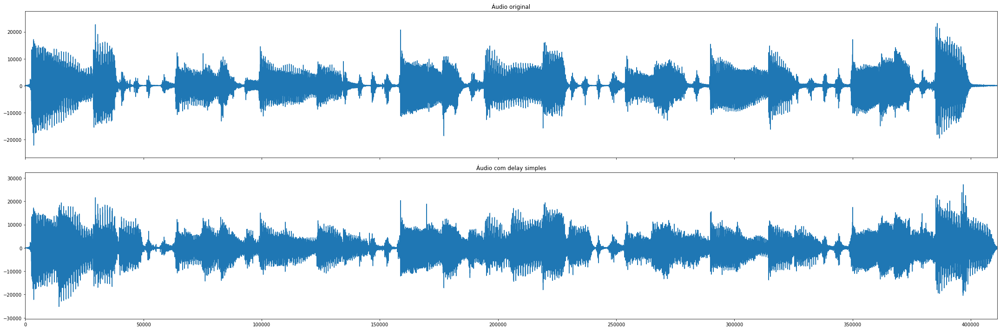

In [139]:
plotar(delay, "Áudio com delay simples")
del delay

Calculando a resposta em frequência do sistema:

$y[n] = x[n] + g \cdot x[n-n_{0}]$

$Y(z) = X(z) + g \cdot X(z) \cdot z^{-n_0}$

$Y(z) = X(z) \cdot [1 + g \cdot z^{-n_0}]$

$\frac{Y(z)}{X(z)} = H(z) = 1 + g \cdot z^{-n_0}$

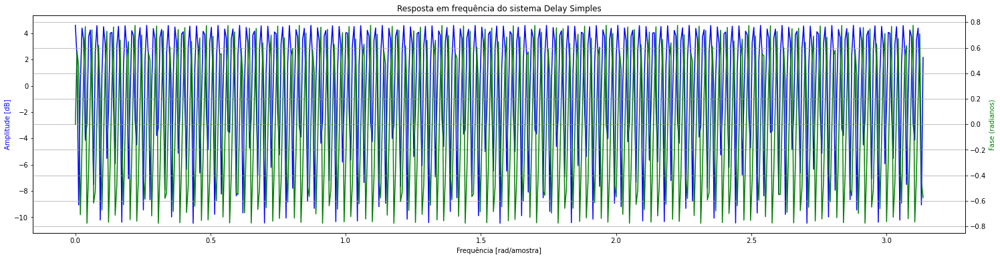

In [140]:
numcont1 = 0
numDelayList = [1]
while numcont1 < sampleDelay:
    numDelayList.append(0)
    numcont1 = numcont1 + 1
numDelayList.append([delayGain])
numDelay = np.array(numDelayList)
denDelay = np.array([1])
plotarH(numDelay, denDelay, "Delay Simples")
del numDelayList, numDelay, denDelay

### Delay Múltiplo

O delay múltiplo consiste em realimentar o sistema com uma amostra atrasada de áudio da saída multiplicada por um ganho (tipicamente menor que 1). A equação do delay simples é $y[n] = x[n] - g \cdot y[n-n_{0}]$, na qual:

*   $g$ é o ganho, representado no código pela variável `delayMulGain`;
*   $n$ é o índice da amostra do sinal, representado no código pelo contador `cont2`;
*   $n_0$ é o atraso medido em amostras, representado no código pela variável `sampleDelayMul`;
*   $x$ é o sinal original, representado no código pelo numpy array `data`, originado da importação do arquivo `.wav`;
*   $y$ é o sinal de saída, representado no código pelo numpy array `delayMul`.

In [141]:
listDelayMul = []
delayMulTime = 0.25
sampleDelayMul = int(delayMulTime*samplerate)
delayMulGain = 0.7
cont2 = 0
while cont2 < qtdSamples:
    if (cont2 < sampleDelayMul):
        listDelayMul.append(data[cont2])
    else:
        listDelayMul.append(np.int16(data[cont2]-\
                    (delayMulGain*listDelayMul[cont2-sampleDelayMul])))
    cont2 = cont2 + 1
delayMul = np.array(listDelayMul)
display(Audio(delayMul,rate=samplerate))
del listDelayMul

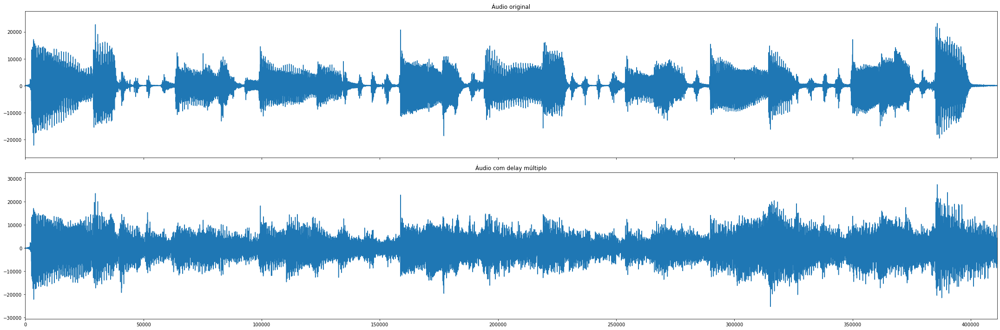

In [142]:
plotar(delayMul, "Áudio com delay múltiplo")
del delayMul

Calculando a resposta em frequência do sistema:

$y[n] = x[n] - g \cdot y[n-n_{0}]$

$Y(z) = X(z) - g \cdot Y(z) \cdot z^{-n_0}$

$Y(z) \cdot [1 + g \cdot z^{-n_0}] = X(z) $

$\frac{Y(z)}{X(z)} = H(z) = \frac{1}{1 + g \cdot z^{-n_0}}$

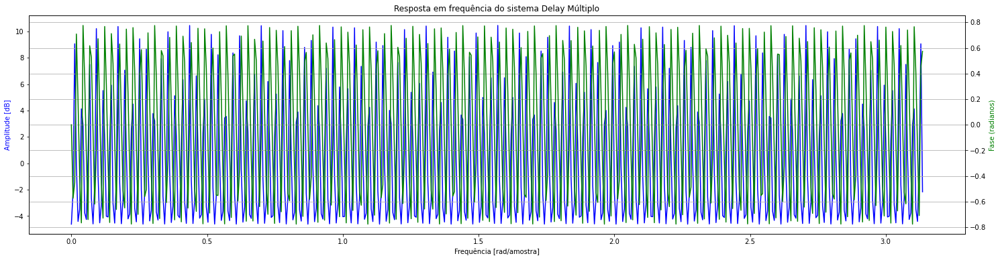

In [143]:
dencont1 = 0
numDelayMul = np.array([1])
denDelayMulList = [1]
while dencont1 < sampleDelayMul:
    denDelayMulList.append(0)
    dencont1 = dencont1 + 1
denDelayMulList.append([delayMulGain])
denDelayMul = np.array(denDelayMulList)
plotarH(numDelayMul, denDelayMul, "Delay Múltiplo")
del denDelayMulList, numDelayMul, denDelayMul

### Chorus

O chorus consiste em aplicar um delay variável entre 20 e 30ms para produzir uma diferenciação no timbre. A equação característica do chorus é $y[n] = x[n] + g \cdot x[n - M[n]]$, onde $M[n] = A_{LFO} \cdot cos(2 \cdot \pi \cdot f_{LFO} \cdot \frac{n}{f_s})$.



*   $g$ é o ganho, representado no código pela variável `chorusGain`;
*   $n$ é o índice da amostra do sinal, representado no código pelo contador `cont3`;
*   $M[n]$ é o atraso variável medido em amostras ($n - M[n]$ é representado no código pela variável `indexChorus`);
*   $x$ é o sinal original, representado no código pelo numpy array `data`, originado da importação do arquivo `.wav`;
*   $y$ é o sinal de saída, representado no código pelo numpy array `chorus`;
*   $A_{LFO}$ é a amplitude de atraso de $M[n]$ medida em amostras, e é representada no código pela variável `aChorusLFO`;
*   $f_{LFO}$ é uma frequência baixa para oscilação do delay variável, e é representada no código pela variável `fChorusLFO`;
*   $f_s$ é a taxa de amostragem do arquivo de áudio, representada no código pela variável `samplerate`.



Para que fosse gerado um delay entre 20 e 30ms, fiz uma alteração em $M[n]$. Primeiro, fixei uma quantidade de amostras média para atraso, de modo que fosse colocado um atraso inicial de 25ms (representado no código pela variável `delayChorusMedio`). A amplitude $A_{LFO}$ foi calculada de modo a gerar um atraso ou adiantamento de até 5ms. Com este atraso/adiantamento variando sua amplitude, temos o delay variável entre 20 e 30ms.

In [144]:
listChorus = []
chorusGain = 0.8
delayChorusMedio = int(0.025*samplerate) #25ms
cont3 = 0
aChorusLFO = int(0.005*samplerate) #amplitude de atraso de 5ms (+ ou -)
fChorusLFO = 0.45
wChorusLFO = 2*np.pi*fChorusLFO
while cont3 < qtdSamples:
    cosAngle = wChorusLFO*cont3/samplerate
    indexChorus = cont3 - (delayChorusMedio + int(aChorusLFO*math.cos(cosAngle)))
    if indexChorus < qtdSamples and indexChorus >= 0:
        listChorus.append(np.int16(data[cont3]+chorusGain*data[indexChorus]))
    else:
        listChorus.append(data[cont3])
    cont3 = cont3 + 1
chorus = np.array(listChorus)
display(Audio(chorus,rate=samplerate))
del listChorus

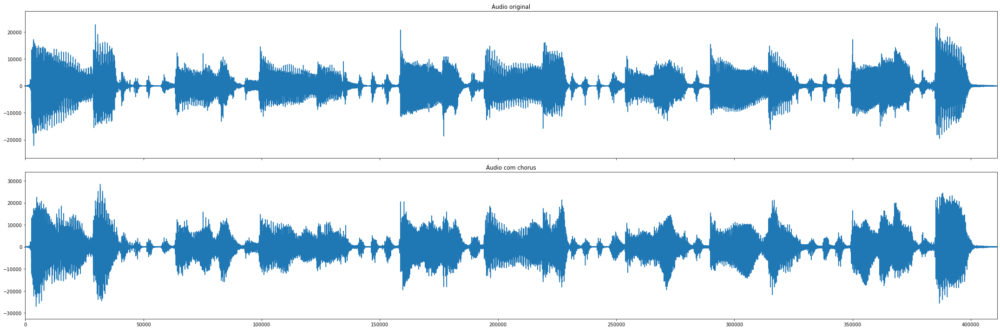

In [145]:
plotar(chorus, "Áudio com chorus")
del chorus

### Flanger

O flanger possui exatamente a mesma base matemática do chorus, porém com o delay variando entre 1 e 10ms. No código, os parâmetros matemáticos são representados como listado a seguir:

*   $g$ é representado no código pela variável `flangerGain`;
*   $n$ é representado no código pelo contador `cont4`;
*   $n-M[n]$ é representado no código pela variável `indexFlanger`;
*   $x$ é o numpy array `data`;
*   $y$ é representado no código pelo numpy array `flanger`;
*   $A_{LFO}$ é representada no código pela variável `aFlangerLFO`;
*   $f_{LFO}$ é representada no código pela variável `fFlangerLFO`;
*   $f_s$ é representada no código pela variável `samplerate`.

Para que fosse gerado um delay entre 1 e 10ms, usei a mesma lógica que usei no chorus: um atraso fixo de 5,5ms (representado no código pela variável `delayFlangerMedio`) e variação de $A_{LFO}$ para atraso/adiantamento de até 4,5ms.

In [146]:
listFlanger = []
flangerGain = 0.9
delayFlangerMedio = int(0.0055*samplerate) #5,5ms
cont4 = 0
aFlangerLFO = int(0.0045*samplerate) #amplitude de atraso de 4,5ms (+ ou -)
fFlangerLFO = 0.6
wFlangerLFO = 2*np.pi*fFlangerLFO
while cont4 < qtdSamples:
    indexFlanger = cont4 - int(aFlangerLFO*math.cos(wFlangerLFO*cont4/samplerate))
    if indexFlanger < qtdSamples and indexChorus >= 0:
        listFlanger.append(np.int16(data[cont4] + flangerGain*data[indexFlanger]))
    else:
        listFlanger.append(data[cont4])
    cont4 = cont4 + 1
flanger = np.array(listFlanger)
display(Audio(flanger,rate=samplerate))
del listFlanger

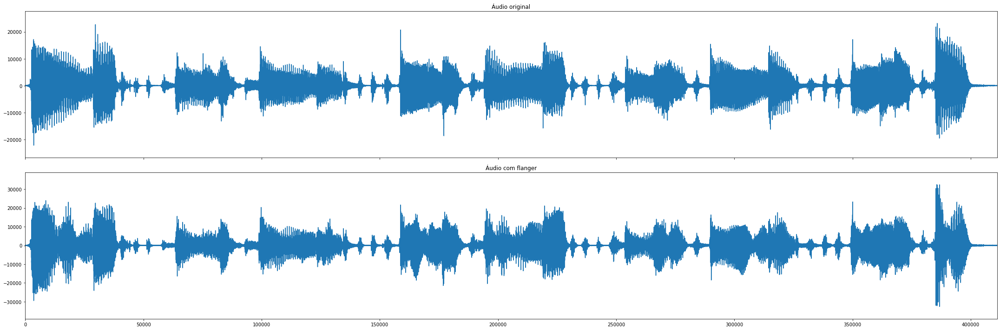

In [147]:
plotar(flanger, "Áudio com flanger")
del flanger

### Tremolo

O tremolo basicamente é uma modulação AM onde o sinal de áudio é a modulante e é utilizada uma senoide de baixa frequência como portadora. A fórmula matemática do tremolo é $y[n] = x[n] \cdot (1 + A_c \cdot cos(2 \cdot \pi \cdot f_c \cdot \frac{n}{f_s}))$, onde:

*   $n$ é o índice da amostra do sinal, representado no código pelo contador `cont5`;
*   $A_c$ é a amplitude da frequência portadora, representada no código pela variável `aTremolo`);
*   $x$ é o sinal original, representado no código pelo numpy array `data`, originado da importação do arquivo `.wav`;
*   $y$ é o sinal de saída, representado no código pelo numpy array `tremolo`;
*   $f_c$ é a frequência portadora, representada no código pela variável `fTremolo`;
*   $f_s$ é a taxa de amostragem do arquivo de áudio, representada no código pela variável `samplerate`.

In [148]:
listTremolo = []
cont5 = 0
aTremolo = 0.4
fTremolo = 8
wTremolo = 2*np.pi*fTremolo
while cont5 < qtdSamples:
    multiplicador = 1 + aTremolo*math.cos(wTremolo*cont5/samplerate)
    listTremolo.append(np.int16(data[cont5]*(multiplicador)))
    cont5 = cont5 + 1
tremolo = np.array(listTremolo)
display(Audio(tremolo,rate=samplerate))
del listTremolo

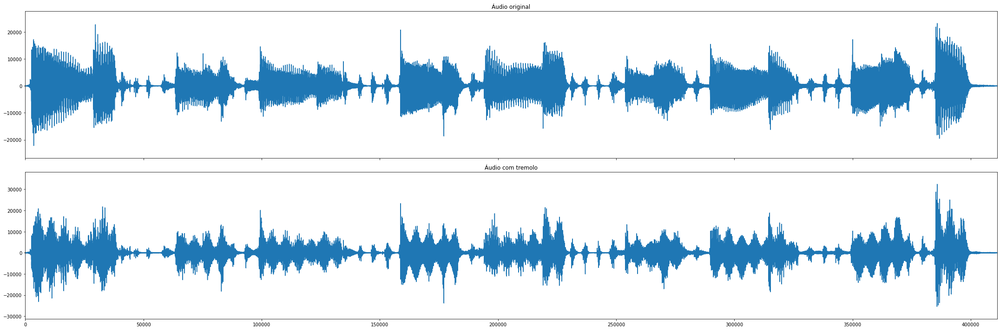

In [149]:
plotar(tremolo, "Áudio com tremolo")
del tremolo

### Modulador em anel

Parecido com o tremolo, porém com a diferença de que a portadora é suprimida no processo de modulação. A fórmula matemática da modulação em anel é $y[n] = x[n] \cdot cos(2 \cdot \pi \cdot f_c \cdot \frac{n}{f_s})$, onde:

*   $n$ é o índice da amostra do sinal, representado no código pelo contador `cont6`;
*   $x$ é o sinal original, representado no código pelo numpy array `data`, originado da importação do arquivo `.wav`;
*   $y$ é o sinal de saída, representado no código pelo numpy array `anel`;
*   $f_c$ é a frequência portadora, representada no código pela variável `fAnel`;
*   $f_s$ é a taxa de amostragem do arquivo de áudio, representada no código pela variável `samplerate`.

In [150]:
listAnel = []
cont6 = 0
fAnel = 8
wAnel = 2*np.pi*fAnel
while cont6 < qtdSamples:
    paramCossenoAnel = wAnel*cont6/samplerate
    listAnel.append(np.int16(data[cont6]*math.cos(paramCossenoAnel)))
    cont6 = cont6 + 1
anel = np.array(listAnel)
display(Audio(anel,rate=samplerate))
del listAnel

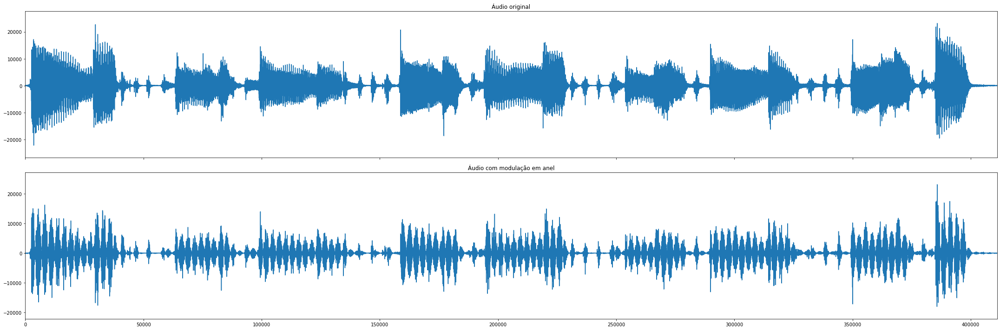

In [151]:
plotar(anel, "Áudio com modulação em anel")
del anel

### Soft Clipping

Também chamado de *overdrive*, é um efeito de distorção de áudio não-linear, mas que apresenta comportamento linear para amplitudes baixas. No soft clipping, a transição entre o linear e o não-linear é suavizada (daí o nome "soft" clipping). A relação matemática entre o sinal de saída e o sinal de entrada do soft clipping é: 

$$f(x) = \left\{\begin{array}{cc}
  -\frac{2}{3}, && x \leq -1 \\
  x - \frac{x^3}{3}, && -1 \leq x \leq 1 \\
  \frac{2}{3}, && x \geq -1
  \end{array}
  \right.$$

Para que tal relação matemática fosse aplicada em termos de valores possíveis de amostra (no caso de profundidade de 16 bits o intervalo de valores inteiros entre -32768 a 32767),  foi estabelecido um valor de *threshold*, o qual representava o "1", e o termo $x$ na equação foi interpretado não como uma amplitude de amostra, mas sim como **a razão entre a amplitude de amostra observada e o nível de *threshold* estabelecido**.

Quando $x$ possuir módulo maior que 1, teremos na saída uma amostra cuja amplitude terá módulo de $\frac{2}{3} \cdot t$, onde $t$ representa o valor de threshold (a amostra de saída terá o mesmo sinal de $x$).

Quando $x$ possuir módulo menor ou igual a 1, teremos na saída uma amostra cuja amplitude será $(x - \frac{x^3}{3}) \cdot t$.

Antes de passar pelo processamento que diz respeito ao *overdrive*, eu aplico um ganho no sinal, o qual é representado no código pela variável `gainSoft`.

In [152]:
listSoft = []
cont7 = 0
thresholdSoft = 8192
gainSoft = 20
while cont7 < qtdSamples:
    tmp = data[cont7]*gainSoft
    if tmp < thresholdSoft and tmp > -thresholdSoft:
        tmp = tmp - ((tmp**3)/(3*(thresholdSoft**2)))
        listSoft.append(np.int16((tmp)))
    elif tmp >= thresholdSoft:
        listSoft.append(np.int16((2*thresholdSoft)/3))
    else:
        listSoft.append(np.int16((-2*thresholdSoft)/3))
    cont7 = cont7 + 1
soft = np.array(listSoft)
display(Audio(soft,rate=samplerate))
del listSoft

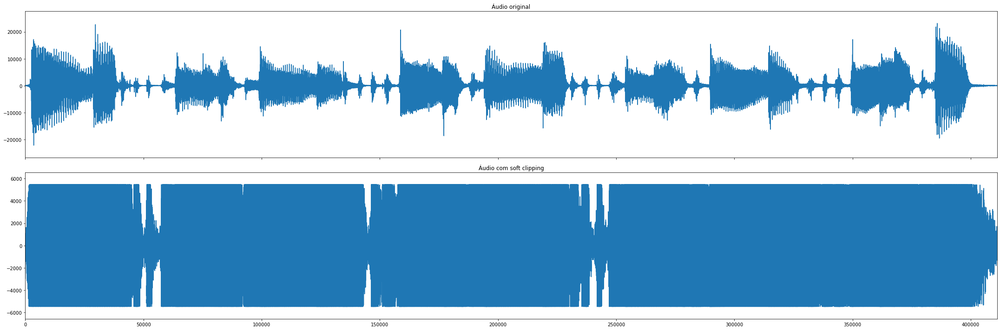

In [153]:
plotar(soft, "Áudio com soft clipping")
del soft

### Hard Clipping

No hard clipping temos algo semelhante ao soft clipping, com a diferença de que a transição entre a região com comportamento linear e a região não-linear não é suavizada, e a distorção é muito mais acentuada. A relação matemática entre o sinal de saída e o sinal de entrada é: 

$$f(x) = \left\{\begin{array}{cc}
  -1, && x \leq -1 \\
  x, && -1 \leq x \leq 1 \\
  1, && x \geq -1
  \end{array}
  \right.$$

Novamente levamos em conta que $x$ é a razão entre a amplitude de amostra observada e um nível de *threshold* estabelecido.

Quando $x$ possuir módulo maior que 1, teremos na saída uma amostra cuja amplitude terá módulo de $t$, (o valor de threshold).

Quando $x$ possuir módulo menor ou igual a 1, teremos na saída uma amostra cuja amplitude será $x \cdot t$, ou seja, a própria amplitude da amostra.

Antes de passar pelo processamento que diz respeito à distorção, eu aplico um ganho no sinal, o qual é representado no código pela variável `gainHard`.

In [154]:
listHard = []
cont8 = 0
thresholdHard = 8192
gainHard = 15
while cont8 < qtdSamples:
    tmp = data[cont8]*gainHard
    if tmp < thresholdHard and tmp > -thresholdHard:
        listHard.append(np.int16(tmp))
    elif data[cont8] <= -thresholdHard:
        listHard.append(np.int16(-thresholdHard))
    else:
        listHard.append(np.int16(thresholdHard))
    cont8 = cont8 + 1
hard = np.array(listHard)
display(Audio(hard,rate=samplerate))
del listHard

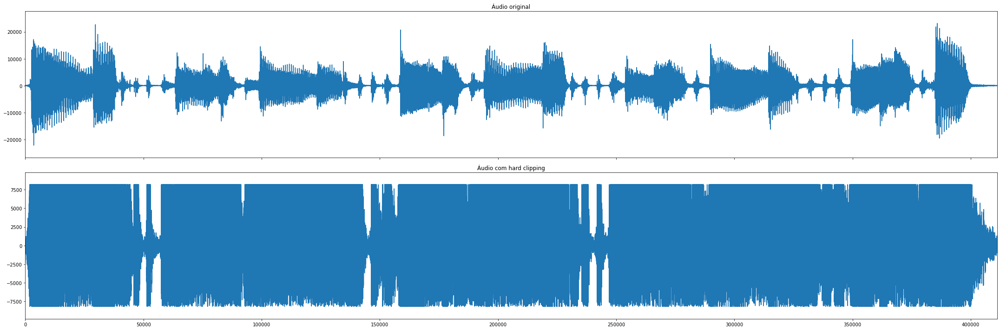

In [155]:
plotar(hard, "Áudio com hard clipping")
del hard

In [156]:
del data